# Australian CPI Forecasting — Methodology Report

*A CRISP-DM walkthrough of every methodology in this project, with the mathematics behind
each one and a live demo of how its forecasts are actually simulated.*

**Core question.** Can external macroeconomic indicators — unemployment, the cash rate,
producer prices, commodity/oil prices, and business inflation expectations — improve
Australian CPI forecasts relative to a seasonal-naive baseline and the RBA's own published
forecasts, for both headline (`cpi_yoy`) and trimmed-mean (`trimmed_mean_cpi_yoy`) inflation?

This notebook runs against the project's real code (`src/models/*.py`) and real curated
data (`data/curated/quarterly_macro_features.csv`) — every number, table, and animation
below was produced by executing the cells in place, in the `cpi_forecast` conda
environment, not pasted in after the fact.

**Contents (CRISP-DM):**
1. [Business Understanding](#1.-Business-Understanding)
2. [Data Understanding](#2.-Data-Understanding)
3. [Data Preparation](#3.-Data-Preparation)
4. [Modeling](#4.-Modeling) — SARIMA · Elastic Net · Ensemble · SVAR · Scenario Engine · RBA Classifier · Credit Stress
5. [Evaluation](#5.-Evaluation)
6. [Deployment](#6.-Deployment)
7. [Conclusion](#7.-Conclusion)

## 1. Business Understanding

Every quarter, the ABS publishes CPI and the RBA reacts to it — or, more precisely, to its
own forecast of it, since policy takes months to bite. Three things make this project's
question harder than "fit a time series model":

- **Two targets, not one.** Headline CPI is politically visible; trimmed-mean CPI is what
  the RBA actually watches for the *underlying* inflation trend, since it discards the
  volatile top/bottom 15% of the price-change distribution each quarter.
- **A moving external benchmark.** The RBA publishes its own CPI forecasts in the
  quarterly Statement on Monetary Policy — a credible institutional baseline this project's
  models are expected to compete against, not just a naive seasonal average.
- **Structure vs. accuracy are different jobs.** Predicting *how much* CPI will move
  (SARIMA, Elastic Net, Ensemble) is a different exercise from explaining *why* it moved, or
  what a hypothetical shock would do to it (SVAR, the scenario engine) — conflating the two
  is a common way forecasting projects overstate what they've shown.

**Success criteria**, previewed here so every later section can be read against them:

$$\mathrm{RMSE} = \sqrt{\frac{1}{n}\sum_{i=1}^n (y_i-\hat y_i)^2} \qquad
P(\text{lower} \le y \le \text{upper}) \approx 0.80 \qquad
\text{macro-F1} = \tfrac{1}{3}\sum_{c\in\{cut,hold,hike\}} F1_c$$

point-forecast accuracy per horizon vs. seasonal-naive and the RBA · nominal 80% interval
coverage · the RBA policy-action classifier's class-balanced F1.

**Out of scope.** The SVAR/scenario engine produces *illustrative* structural simulations,
not causal point estimates — both systems fail multivariate residual whiteness and
normality diagnostics even after COVID treatment and a block-bootstrap fix. Every scenario
output downstream is labelled accordingly.

## 2. Data Understanding

The curated dataset is a single quarterly table (`data/curated/quarterly_macro_features.csv`)
built from ABS CPI, ABS trimmed-mean CPI, RBA cash-rate decisions, RBA/ABS labour-force and
producer-price series, WTI/Brent crude, and the RBA's own published CPI forecast workbook —
joined on quarter, no manual pasting.

In [37]:
import sys, warnings
from pathlib import Path

PROJECT_ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
sys.path.insert(0, str(PROJECT_ROOT))
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, Image, display

INK, PAPER, ACCENT, ACCENT_SOFT, HIGHLIGHT, GRID = (
    "#16211c", "#f7f8f5", "#1f6f66", "#bfe3dd", "#a8691f", "#d9ddd6",
)
plt.rcParams.update({
    "figure.facecolor": PAPER, "axes.facecolor": PAPER, "axes.edgecolor": GRID,
    "axes.labelcolor": INK, "text.color": INK, "xtick.color": INK, "ytick.color": INK,
    "font.size": 11, "axes.grid": True, "grid.color": GRID, "grid.linewidth": 0.6,
    "axes.spines.top": False, "axes.spines.right": False,
})

CURATED = PROJECT_ROOT / "data/curated/quarterly_macro_features.csv"
df = pd.read_csv(CURATED)
print(f"{len(df)} quarters, {df['quarter'].iloc[0]}–{df['quarter'].iloc[-1]}, {df.shape[1]} columns")
df[["quarter", "cpi_yoy", "trimmed_mean_cpi_yoy", "unemployment_rate", "cash_rate"]].tail()

128 quarters, 1995Q1–2026Q4, 54 columns


,quarter,cpi_yoy,trimmed_mean_cpi_yoy,unemployment_rate,cash_rate
123,2025Q4,3.7,3.3,4.257327,3.600000
124,2026Q1,4.0,3.5,4.223809,3.850000
125,2026Q2,3.9,3.6,4.434078,4.266667
126,2026Q3,NaN,NaN,4.461825,4.350000
127,2026Q4,NaN,NaN,NaN,NaN


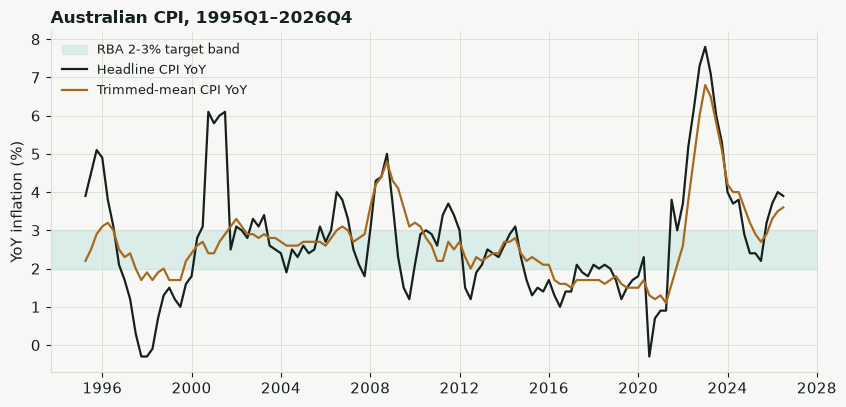

In [38]:
hist = df[["quarter", "cpi_yoy", "trimmed_mean_cpi_yoy"]].copy()
hist["quarter_date"] = pd.PeriodIndex(hist["quarter"], freq="Q").to_timestamp(how="end")

fig, ax = plt.subplots(figsize=(8.6, 4.2))
ax.axhspan(2, 3, color=ACCENT_SOFT, alpha=0.5, zorder=0, label="RBA 2-3% target band")
ax.plot(hist["quarter_date"], hist["cpi_yoy"], color=INK, linewidth=1.6, label="Headline CPI YoY")
ax.plot(hist["quarter_date"], hist["trimmed_mean_cpi_yoy"], color=HIGHLIGHT, linewidth=1.6,
        label="Trimmed-mean CPI YoY")
ax.set_ylabel("YoY inflation (%)")
ax.set_title(f"Australian CPI, {hist['quarter'].iloc[0]}–{hist['quarter'].iloc[-1]}",
             loc="left", fontsize=12, fontweight="bold")
ax.legend(frameon=False, loc="upper left", fontsize=9)
fig.tight_layout()
plt.show()

Both series track each other closely except where headline gets pulled around by volatile
items the trimmed mean discards by construction — the GST introduction (2000-01) and the
2020 COVID childcare/fuel shock are the two sharpest headline-only spikes above.

## 3. Data Preparation

Two rules govern every feature in this table:

- **Leakage-aware lags.** Every macro predictor enters as a *lag*, never contemporaneously
  — a forecast made "as of" quarter $t$ only ever sees data that would genuinely have been
  published by then (`src/features.py`).
- **Documented interventions, not silent dummies.** Structural breaks (GST, COVID) are
  captured as named dummy columns with a cited reason and a genuine forecast-lead-time
  count — not fitted after the fact to explain away a residual.

In [39]:
interventions = pd.read_csv(PROJECT_ROOT / "data/metadata/intervention_quarters.csv")
interventions[["quarter", "dummy_name", "lead_quarters", "reason"]].assign(
    reason=lambda d: d["reason"].str.slice(0, 90) + "…"
)

,quarter,dummy_name,lead_quarters,reason
0,2020Q2,covid_shock_down,0,"CPI fell 1.9% q/q, the largest fall on record,..."
1,2020Q3,covid_shock_rebound,1,"CPI rose 1.6% q/q, the largest rise in 20 year..."


## 4. Modeling

Three levels of ambition, in one project:

| | Job | Families |
|---|---|---|
| **Accuracy** | forecast the number | SARIMA, Elastic Net, Ensemble |
| **Structure** | explain a shock | SVAR, Scenario Engine |
| **Decisions** | classify RBA policy / stress-test credit losses | RBA Classifier, Credit Stress |

Every equation below is taken from the code that actually runs, cited to its source file.
Every demo below shares the project's own pinned forecast origin, **`2025Q4`**
(`svar.FORECAST_ORIGIN_PIN`) — the same origin `svar.py` and `scenario.py` already
truncate to, and the one every checked-in report (SVAR, RBA classifier, credit stress,
the Streamlit Forecasts page) was generated at. The curated dataset itself has since grown
past that quarter as fresher ABS/RBA releases were pulled in, so a naive fresh refit on
"all available data" would silently land on a *later*, inconsistent origin — 4.3 below
truncates to the pin explicitly, for exactly this reason, rather than letting the origin
drift. 4.4/4.6/4.7 read the project's existing precomputed snapshots, already computed at
that same pinned origin.

### 4.1 SARIMA — the univariate baseline

$$\varphi(B)\Phi(B^4)(1-B)^d(1-B^4)^D y_t = \theta(B)\Theta(B^4)\,\varepsilon_t$$

The shipped headline order is $(1,0,2)\times(1,0,2,4)$: last quarter's value and shock,
an MA(2) memory, and the same pattern echoed four quarters back — the seasonal term. Zero
exogenous inputs, by design: it exists to answer *how far CPI's own history carries a
forecast*, before any macro predictor is added.

*Source: `src/models/sarima.py`*

In [40]:
from src.models.sarima import DEFAULT_ORDER, DEFAULT_SEASONAL_ORDER
print(f"Shipped headline SARIMA order: {DEFAULT_ORDER} x {DEFAULT_SEASONAL_ORDER}")

Shipped headline SARIMA order: (1, 0, 2) x (1, 0, 2, 4)


### 4.2 Elastic Net — regularized, direct multi-horizon

$$\hat\beta_h = \operatorname*{argmin}_{\beta}\ \frac{1}{2n}\lVert y_{t+h}-X_t\beta\rVert_2^2
+ \alpha\rho\lVert\beta\rVert_1 + \alpha\tfrac{1-\rho}{2}\lVert\beta\rVert_2^2 ,\qquad h=1,\dots,8$$

One fitted $\beta_h$ *per horizon* — not one model rolled forward eight times. $\alpha$ and
$\rho$ (`l1_ratio`) are chosen by `GridSearchCV` over chronological `TimeSeriesSplit` folds,
scaler refit inside each fold. The $\ell_1$ term can zero out a weak macro feature entirely;
the $\ell_2$ term keeps correlated survivors from cancelling each other out.

**This argmin does not minimize RMSE, deliberately.** The `(1/2n)‖·‖²` term is proportional
to MSE, but the $\ell_1$/$\ell_2$ penalty terms bias $\hat\beta_h$ *away* from the
MSE-minimizing (OLS) solution on purpose — that trade-off is the entire mechanism of
regularization: accept worse in-sample fit for coefficients that generalize better
out-of-sample. `GridSearchCV`'s own `scoring="neg_mean_squared_error"` isn't RMSE either,
though for *ranking* candidate `(α, l1_ratio)` pairs it's equivalent — RMSE = √MSE, and
√ is monotonic, so MSE and RMSE always pick the same winner. The project's headline RMSE
success criterion (§1) only re-enters once $\hat\beta_h$ is fixed: it's the walk-forward,
out-of-sample metric used in §5 Evaluation to compare Elastic Net's *resulting forecasts*
against SARIMA, Ensemble, seasonal-naive, and the RBA — not a claim that every family's own
training loss literally is RMSE.

*Source: `src/models/elastic_net.py`*

In [41]:
coefs = pd.read_csv(PROJECT_ROOT / "reports/elastic_net_coefficients.csv")
h1 = coefs[coefs["horizon"] == 1].copy()
h1["abs_coef"] = h1["coef"].abs()
print(f"alpha={h1['selected_alpha'].iloc[0]:.4f}  l1_ratio={h1['selected_l1_ratio'].iloc[0]:.2f}"
      f"  ({(h1['coef'] == 0).sum()} of {len(h1)} horizon-1 features shrunk to exactly zero)")
h1.sort_values("abs_coef", ascending=False).head(6)[["feature", "coef"]]

alpha=0.1668  l1_ratio=0.70  (6 of 11 horizon-1 features shrunk to exactly zero)


,feature,coef
4,inflation_expectations_business_lag1,0.687255
0,cpi_yoy_lag1,0.256226
2,cash_rate_change_lag1,0.122582
7,wti_growth_lag1,0.079576
3,unemployment_rate_change_lag1,-0.003648
1,cpi_yoy_lag4,-0.000000


### 4.3 Ensemble — inverse-RMSE blend, and the flagship demo

$$\hat y_{ens,h} = w_h\,\hat y_{SARIMA,h} + (1-w_h)\,\hat y_{EN,h}, \qquad
w_h \propto \frac{1}{\mathrm{RMSE}_{SARIMA,h}}$$

Whichever family won at *that specific horizon* in the walk-forward comparison gets more
say — the weight can and does change from horizon 1 to horizon 8. This is also the
project's reportable forecast, so it's the one worth actually watching get built: the cell
below truncates to the project's pinned forecast origin, draws 1,000 Monte-Carlo paths from
the fitted SARIMA + Elastic Net components, combines them horizon-by-horizon, and animates
a sample of them fanning out into the **raw, uncalibrated** 80%/50% simulated interval —
press play. This is *not* the same interval `forecast.csv`/the live API actually serve —
see the width comparison after the animation for exactly how much narrower it is.

*Source: `src/models/ensemble.py`*

In [42]:
from src.models import ensemble, svar
from src.models.elastic_net import ELASTIC_NET_FEATURE_COLUMNS, TARGET_COLUMN, load_elastic_net_feature_frame
from src.models.evaluation import load_target_series
from src.models.interval_coverage import DEFAULT_SEED
from src.models.simulation_fan import DEFAULT_N_SIMS

ORIGIN = svar.FORECAST_ORIGIN_PIN  # 2025Q4 -- the same pin every other report in this project shares

series = load_target_series(CURATED, target_column=TARGET_COLUMN)
features = load_elastic_net_feature_frame(CURATED, feature_columns=ELASTIC_NET_FEATURE_COLUMNS)
frame = pd.concat([series.rename(TARGET_COLUMN), features], axis=1).dropna().sort_index()

print(f"curated data actually runs to cpi_yoy={series.index[-1]}, macro block={frame.index[-1]} "
      f"-- truncating both to the shared pin {ORIGIN} instead of drifting forward with them")
series = series.loc[:ORIGIN]
frame = frame.loc[:ORIGIN]
assert series.index[-1] == frame.index[-1] == ORIGIN

paths = ensemble.simulate_ensemble_paths(
    frame, steps=8, n_sims=DEFAULT_N_SIMS, seed=DEFAULT_SEED,
    target_column=TARGET_COLUMN, sarima_series=series,
)
forecast_origin = str(frame.index[-1])
quarters = [str(frame.index[-1] + h) for h in range(1, 9)]
p10, p25, med, p75, p90 = np.percentile(paths, [10, 25, 50, 75, 90], axis=0)
print(f"origin {forecast_origin}: median h1={med[0]:.2f}%  h8={med[-1]:.2f}%  "
      f"(80% band at h8: [{p10[-1]:.2f}, {p90[-1]:.2f}])")

# Reproducibility check -- same pin, same seed, same method as the checked-in
# report, so these should match almost exactly (small drift only if ABS has
# since revised a historical print between when that report was generated and now).
_checked_in = pd.read_csv(PROJECT_ROOT / "reports/simulation_fan_ensemble.csv")
_ref = _checked_in.iloc[0]
print(f"reproducibility -- reports/simulation_fan_ensemble.csv h1 median={_ref['median']:.2f}% "
      f"vs. this notebook's h1 median={med[0]:.2f}%  (confirms the pipeline, not the point forecast below)")

# This is a *different* comparison: the deterministic point forecast actually served
# by the API / shown in Tableau and Streamlit used to NOT be the median of
# these simulated paths -- it comes from ensemble.combine_point_forecasts(),
# which weighted-averages each component's own single point prediction
# directly, while the median above weighted-averages 1,000 *paired* Monte
# Carlo draws and only then takes the 50th percentile -- not the same
# arithmetic, since median doesn't distribute over a weighted sum of two
# independently-simulated components. As of 2026-09-14,
# ensemble.recenter_paths_to_median() shifts the combined draws per horizon
# by exactly this gap, so the two now agree exactly (up to floating point) --
# the print below should show ~0.000pp at every horizon.
_reported = pd.read_csv(PROJECT_ROOT / "reports/tableau/forecast.csv")
_reported = _reported[(_reported["model_family"] == "ensemble") & (_reported["target"] == "Headline")]
_reported_vals = _reported.sort_values("horizon")["forecast"].to_numpy()
_gap_median = _reported_vals - med
print(f"reported vs. simulated median -- h1 gap={_gap_median[0]:+.3f}pp, h8 gap={_gap_median[-1]:+.3f}pp "
      f"(recentered onto the point forecast by construction, since 2026-09-14)")

# The simulated *mean* is deliberately left off this recentering, and still
# shows a gap. Mean, unlike median, IS linear, so mean(w*A + (1-w)*B) =
# w*mean(A) + (1-w)*mean(B) exactly -- but recentering targets the MEDIAN
# (matching this project's existing median-centering convention), and a pure
# additive shift moves the whole distribution, mean included, without
# changing its shape. CPI's residual pool is right-skewed (occasional sharp
# upside prints -- GST, COVID reopening, 2021-23 inflation surge -- with no
# equally sharp downside counterpart), so the mean still sits above both the
# now-exact median and the reported point forecast at every horizon.
sim_mean = paths.mean(axis=0)
_gap_mean = _reported_vals - sim_mean
print(f"reported vs. simulated mean   -- h1 gap={_gap_mean[0]:+.3f}pp, h8 gap={_gap_mean[-1]:+.3f}pp "
      f"(further off than the median at every horizon -- consistent with right-skewed residuals)")

curated data actually runs to cpi_yoy=2026Q2, macro block=2026Q1 -- truncating both to the shared pin 2025Q4 instead of drifting forward with them
origin 2025Q4: median h1=3.21%  h8=3.08%  (80% band at h8: [1.88, 4.66])
reproducibility -- reports/simulation_fan_ensemble.csv h1 median=3.15% vs. this notebook's h1 median=3.21%  (confirms the pipeline, not the point forecast below)
reported vs. simulated median -- h1 gap=-0.059pp, h8 gap=-0.187pp (recentered onto the point forecast by construction, since 2026-09-14)
reported vs. simulated mean   -- h1 gap=-0.118pp, h8 gap=-0.312pp (further off than the median at every horizon -- consistent with right-skewed residuals)


In [43]:
rng = np.random.default_rng(7)
sample = paths[rng.choice(paths.shape[0], size=120, replace=False)]
x_hist, y_hist = np.array([-3, -2, -1, 0]), series.to_numpy()[-4:]
x_fore = np.arange(0, 9)

fig, ax = plt.subplots(figsize=(8.6, 4.6))
ax.set_xlim(-3, 8.3)
pad = 1.2
ax.set_ylim(min(y_hist.min(), p10.min()) - pad, max(y_hist.max(), p90.max()) + pad)
ax.set_xticks(list(x_hist) + list(x_fore[1:]))
ax.set_xticklabels([str(frame.index[-1] + o) for o in [-3, -2, -1, 0]] + quarters,
                    rotation=45, ha="right")
ax.set_ylabel("Headline CPI YoY (%)")
ax.set_title(f"Ensemble Monte-Carlo simulation — origin {forecast_origin}, "
             f"{DEFAULT_N_SIMS} draws (120 shown)", loc="left", fontsize=11.5, fontweight="bold")
ax.plot(x_hist, y_hist, color=INK, linewidth=2.0, marker="o", markersize=3, zorder=5, label="History")
ax.axvline(0, color=INK, linewidth=0.8, linestyle=":", alpha=0.6)

path_lines = [ax.plot([], [], color=ACCENT, linewidth=0.7, alpha=0.35)[0] for _ in range(sample.shape[0])]
band_outer = ax.fill_between([], [], [], color=ACCENT, alpha=0.14)
band_inner = ax.fill_between([], [], [], color=ACCENT, alpha=0.28)
median_line, = ax.plot([], [], color="#123f3a", linewidth=2.2, marker="o", markersize=3, zorder=6,
                        label="Simulated median")
ax.legend(frameon=False, loc="upper left", fontsize=9)

N_REVEAL, N_SETTLE = 40, 18
reveal_counts = np.linspace(3, sample.shape[0], N_REVEAL).astype(int)

def update(i):
    global band_outer, band_inner
    if i < N_REVEAL:
        n_shown = reveal_counts[i]
        for k, line in enumerate(path_lines):
            line.set_data(x_fore, np.concatenate([[y_hist[-1]], sample[k]])) if k < n_shown else line.set_data([], [])
        median_line.set_data([], [])
        band_outer.remove(); band_inner.remove()
        band_outer = ax.fill_between([], [], [], color=ACCENT, alpha=0.14)
        band_inner = ax.fill_between([], [], [], color=ACCENT, alpha=0.28)
    else:
        t = (i - N_REVEAL + 1) / N_SETTLE
        for line in path_lines:
            line.set_alpha(max(0.0, 0.35 * (1 - t)))
        y_med = np.concatenate([[y_hist[-1]], med])
        reveal_h = max(1, int(8 * min(t * 1.3, 1)))
        median_line.set_data(x_fore[: reveal_h + 1], y_med[: reveal_h + 1])
        band_outer.remove(); band_inner.remove()
        xs = x_fore[: reveal_h + 1]
        band_outer = ax.fill_between(xs, np.concatenate([[y_hist[-1]], p10])[: reveal_h + 1],
                                      np.concatenate([[y_hist[-1]], p90])[: reveal_h + 1], color=ACCENT, alpha=0.14)
        band_inner = ax.fill_between(xs, np.concatenate([[y_hist[-1]], p25])[: reveal_h + 1],
                                      np.concatenate([[y_hist[-1]], p75])[: reveal_h + 1], color=ACCENT, alpha=0.28)
    return path_lines + [median_line]

anim = animation.FuncAnimation(fig, update, frames=N_REVEAL + N_SETTLE, interval=90, blit=False)
plt.close(fig)
HTML(anim.to_jshtml())

In [44]:
# The band above is the RAW p10-p90 spread of these 1,000 draws -- not the
# calibrated interval actually served by forecast.csv / the live API.
# interval_calibration.py found the raw simulated interval under-covers (fewer
# than 80% of real outcomes historically fell inside it), so serving applies a
# per-horizon scale_factor on top: interval = point +/- scale_factor * raw_half_width.
# That scaling isn't reproduced here -- this animation is illustrating what the
# simulation itself looks like, not the calibrated product.
_raw_width = p90 - p10
_cal = pd.read_csv(PROJECT_ROOT / "reports/tableau/forecast.csv")
_cal = _cal[(_cal["model_family"] == "ensemble") & (_cal["target"] == "Headline")].sort_values("horizon")
_calibrated_width = (_cal["interval_upper"] - _cal["interval_lower"]).to_numpy()
_scale = _calibrated_width / _raw_width
print(f"raw vs. calibrated interval width -- h1: {_raw_width[0]:.2f} vs {_calibrated_width[0]:.2f} "
      f"({_scale[0]:.2f}x)  |  h8: {_raw_width[-1]:.2f} vs {_calibrated_width[-1]:.2f} ({_scale[-1]:.2f}x)")

raw vs. calibrated interval width -- h1: 1.32 vs 1.40 (1.06x)  |  h8: 2.77 vs 4.09 (1.48x)


### 4.4 SVAR — structural systems for both CPI measures

$$y_t = c + A_1y_{t-1} + A_2y_{t-2} + u_t,\quad u_t\sim(0,\Sigma) \qquad\qquad
\Sigma = PP',\ \ \varepsilon_t = P^{-1}u_t \qquad\qquad
\Theta_h = \Phi_h P$$

Two five-variable VAR(2)-in-levels systems (System A → `cpi_yoy`, System B →
`trimmed_mean_cpi_yoy`), recursive Cholesky ordering commodity growth → unemployment →
CPI target → business inflation expectations → cash rate, 80% contiguous block-bootstrap
IRF bands. **Read every panel below as illustrative, not causal** — both systems still
reject multivariate residual whiteness and normality after COVID treatment checks.

*Source: `src/models/svar.py`, exported to `reports/tableau/svar_irf.csv`*

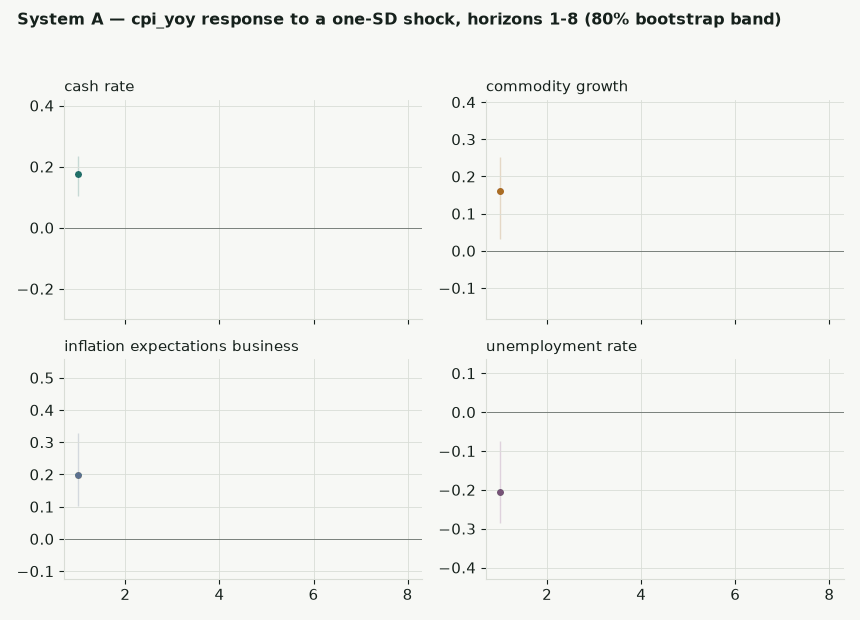

In [45]:
irf = pd.read_csv(PROJECT_ROOT / "reports/tableau/svar_irf.csv")
irf = irf[(irf["system"] == "System A") & (irf["response"] == "cpi_yoy")].copy()
shocks = sorted(irf["shock"].unique())
scolors = {shocks[0]: ACCENT, shocks[1]: HIGHLIGHT, shocks[2]: "#5b6f8f", shocks[3]: "#8a4f8a"}

fig, axes = plt.subplots(2, 2, figsize=(8.6, 6.2), sharex=True)
axes = axes.ravel()
lines, bands = [], []
for ax, shock in zip(axes, shocks):
    ax.axhline(0, color=INK, linewidth=0.7, alpha=0.5)
    ax.set_title(shock.replace("_", " "), fontsize=10.5, loc="left")
    ax.set_xlim(0.7, 8.3)
    sub = irf[irf["shock"] == shock].sort_values("horizon")
    pad = 0.15 * (sub["upper"].max() - sub["lower"].min())
    ax.set_ylim(sub["lower"].min() - pad, sub["upper"].max() + pad)
    bands.append(ax.fill_between([], [], [], color=scolors[shock], alpha=0.22))
    line, = ax.plot([], [], color=scolors[shock], linewidth=2.0, marker="o", markersize=4)
    lines.append(line)
fig.suptitle("System A — cpi_yoy response to a one-SD shock, horizons 1-8 (80% bootstrap band)",
             fontsize=11.5, fontweight="bold", x=0.02, ha="left")
fig.tight_layout(rect=(0, 0, 1, 0.95))

def update_irf(h):
    for i, shock in enumerate(shocks):
        sub = irf[irf["shock"] == shock].sort_values("horizon")
        sub = sub[sub["horizon"] <= h]
        lines[i].set_data(sub["horizon"], sub["irf"])
        bands[i].remove()
        bands[i] = axes[i].fill_between(sub["horizon"], sub["lower"], sub["upper"], color=scolors[shock], alpha=0.22)
    return lines

anim_irf = animation.FuncAnimation(fig, update_irf, frames=list(range(1, 9)) + [8] * 6, interval=350, blit=False)
gif_path = PROJECT_ROOT / "notebooks/assets/svar_animation.gif"
gif_path.parent.mkdir(parents=True, exist_ok=True)
anim_irf.save(gif_path, writer=animation.PillowWriter(fps=3))
plt.close(fig)
Image(filename=str(gif_path))

### 4.5 Scenario Engine — SVAR shocks meet the Ensemble

$$\Delta_h = \text{shock}\times \mathrm{IRF}_h(\text{driver}\to\text{target}),\quad
\text{shock} = \text{input} - \mathrm{SVAR}_{h=1} \qquad\qquad
\hat y^{*}_{h,i} = \hat y_{ens,h,i} + \Delta_{h,i}$$

Only the *surprise* over SVAR's own horizon-1 forecast counts, so the expected macro path
is never double-counted; draws are paired index-for-index (Ensemble draw $i$ with SVAR
bootstrap draw $i$), never randomly matched. Because the shock lands at $t{+}1$, CPI
horizon $h$ receives IRF index $h-1$.

*Source: `src/models/scenario.py`, served at `POST /forecast/scenario`*

### 4.6 RBA Policy Classifier — seven readings of one decision

$$\text{action} = \begin{cases}\text{cut} & \hat y < 2.0 \\ \text{hike} & \hat y > 3.0 \\
\text{hold} & \text{otherwise}\end{cases} \qquad
i^{*} = r^{*} + \pi + \varphi_\pi(\pi-2.5) + \varphi_u\,\Delta u_{t-1} \qquad
P(Y\le j) = F(\theta_j - x'\beta)$$

left to right: the transparent **threshold** baseline (reportable, macro-F1 0.775); the
**Taylor rule** (fixed and estimated variants); **ordered logit/probit** ($F$ = logistic or
$\Phi$). Frank–Hall XGBoost decomposes the same ordinal target into $K{-}1$ cumulative
binary classifiers; majority vote takes the mode of the first four, tie-broken by
threshold's own call.

*Source: `src/models/rba_classifier.py`, served at `GET /rba-action`*

Forecast origin 2025Q4 → target 2026Q1: reportable call is 'hike' (threshold)


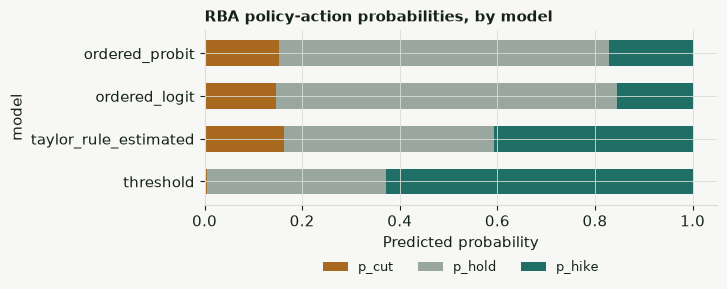

In [46]:
rba = pd.read_csv(PROJECT_ROOT / "reports/tableau/rba_action.csv")
print(f"Forecast origin {rba['forecast_origin'].iloc[0]} → target {rba['target_quarter'].iloc[0]}: "
      f"reportable call is '{rba['reportable_action'].iloc[0]}' ({rba['reportable_model'].iloc[0]})")
probs = rba.dropna(subset=["p_cut"]).set_index("model")[["p_cut", "p_hold", "p_hike"]]

fig, ax = plt.subplots(figsize=(7.4, 3.2))
probs.plot(kind="barh", stacked=True, ax=ax, color=[HIGHLIGHT, "#9aa79f", ACCENT], width=0.6)
ax.set_xlabel("Predicted probability")
ax.set_title("RBA policy-action probabilities, by model", loc="left", fontsize=11, fontweight="bold")
ax.legend(frameon=False, ncol=3, fontsize=9, loc="upper center", bbox_to_anchor=(0.5, -0.25))
fig.tight_layout()
plt.show()

### 4.7 Credit Stress & Illustrative ECL

$$PD_{stressed} = \operatorname{clip}\!\big(PD_{base} + s\cdot\Delta u_{cum}/100,\ PD_{base},\ 1.0\big)
\qquad ECL = \dfrac{PD_{stressed}\times LGD\times EAD}{(1+r)^{0.5}} \qquad
ECL_{weighted} = \!\!\sum_{scenario}\!\! w_{scenario}\,ECL_{scenario}$$

NAB's own disclosed FY2025 Pillar 3 PD/LGD/EAD, stressed with generic RBA sensitivity
coefficients (0.4pp personal loans / 0.6pp mortgages per point of cumulative unemployment
change), mid-year discounted at RBA's published lending rates, and combined with NAB's own
55/42.5/2.5 base/downside/upside scenario weights. **This is 12-month, Stage-1-only and is
not a lower bound on NAB's real provision** — no Stage 2/3 staging logic exists.

*Source: `src/models/credit_stress.py`, served at `GET /credit-risk/stress-test`*

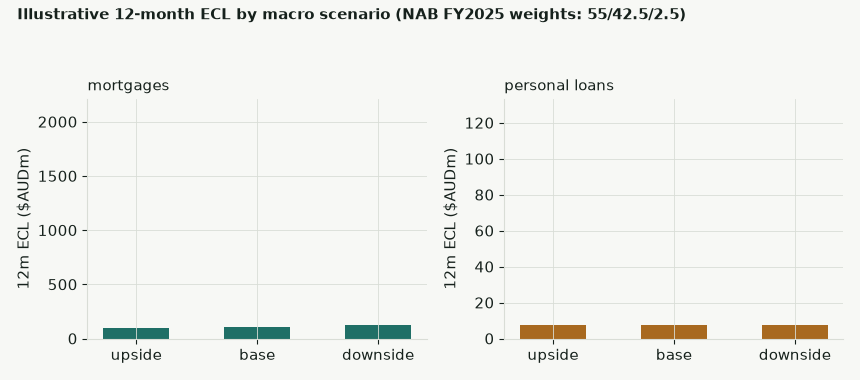

,segment,probability_weighted_ecl_aud_m
0,personal_loans,104.612271
3,mortgages,1588.636471


In [47]:
credit = pd.read_csv(PROJECT_ROOT / "reports/tableau/credit_stress.csv")
order = ["upside", "base", "downside"]
segs = ["mortgages", "personal_loans"]
scol = {"mortgages": ACCENT, "personal_loans": HIGHLIGHT}

fig, axes = plt.subplots(1, 2, figsize=(8.6, 3.8))
bars = {}
for ax, seg in zip(axes, segs):
    sub = credit[credit["segment"] == seg].set_index("scenario").loc[order]
    ax.set_ylim(0, sub["ecl_aud_m"].max() * 1.25)
    ax.set_title(seg.replace("_", " "), fontsize=11, loc="left")
    ax.set_ylabel("12m ECL ($AUDm)")
    bars[seg] = (ax.bar(order, [0, 0, 0], color=scol[seg], width=0.55), sub["ecl_aud_m"].to_numpy())
fig.suptitle("Illustrative 12-month ECL by macro scenario (NAB FY2025 weights: 55/42.5/2.5)",
             fontsize=11, fontweight="bold", x=0.02, ha="left")
fig.tight_layout(rect=(0, 0, 1, 0.92))

N = 20
def update_credit(i):
    t = min(1.0, (i + 1) / (N - 6))
    artists = []
    for seg in segs:
        bar, targets = bars[seg]
        for rect, target in zip(bar, targets):
            rect.set_height(target * t)
        artists.extend(bar)
    return artists

anim_credit = animation.FuncAnimation(fig, update_credit, frames=N, interval=80, blit=False)
gif_path2 = PROJECT_ROOT / "notebooks/assets/credit_stress_animation.gif"
anim_credit.save(gif_path2, writer=animation.PillowWriter(fps=12))
plt.close(fig)
display(Image(filename=str(gif_path2)))

weighted = credit.drop_duplicates("segment")[["segment", "ecl_aud_m_12m_probability_weighted"]]
weighted.columns = ["segment", "probability_weighted_ecl_aud_m"]
weighted

## 5. Evaluation

Walk-forward comparison on the shared horizon-1-to-8 grid, against seasonal-naive and the
RBA's own published forecasts.

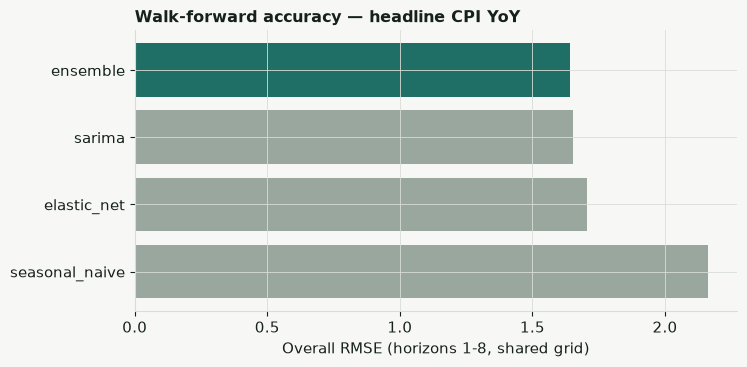

,model,n,rmse,mae
0,ensemble,424,1.640356,1.159850
1,sarima,424,1.652592,1.155351
2,elastic_net,424,1.705798,1.245831
3,seasonal_naive,424,2.163358,1.518632


In [48]:
comp = pd.read_csv(PROJECT_ROOT / "reports/model_comparison_all.csv")
overall = comp[comp["horizon"] == "overall"].sort_values("rmse")

fig, ax = plt.subplots(figsize=(7.6, 3.8))
colors = [ACCENT if m == "ensemble" else ("#9aa79f" if m != "rba" else HIGHLIGHT) for m in overall["model"]]
ax.barh(overall["model"], overall["rmse"], color=colors)
ax.invert_yaxis()
ax.set_xlabel("Overall RMSE (horizons 1-8, shared grid)")
ax.set_title("Walk-forward accuracy — headline CPI YoY", loc="left", fontsize=11.5, fontweight="bold")
fig.tight_layout()
plt.show()
overall[["model", "n", "rmse", "mae"]].reset_index(drop=True)

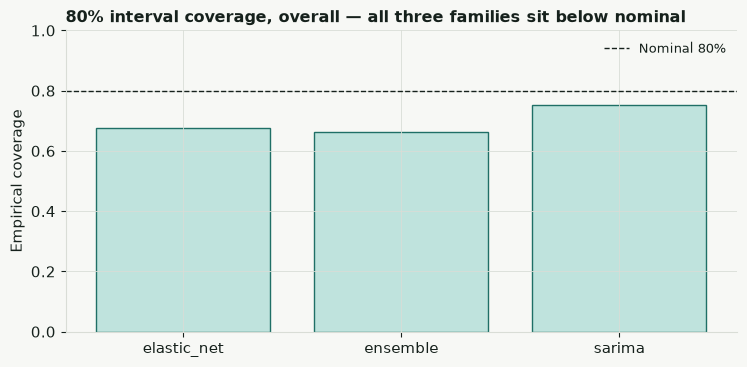

In [49]:
cov = pd.read_csv(PROJECT_ROOT / "reports/model_interval_coverage.csv")
cov_overall = (cov[cov["horizon"] == "overall"] if "overall" in cov["horizon"].astype(str).unique()
               else cov.groupby("model", as_index=False)["empirical_coverage"].mean())

fig, ax = plt.subplots(figsize=(7.6, 3.8))
ax.axhline(0.8, color=INK, linestyle="--", linewidth=1, label="Nominal 80%")
ax.bar(cov_overall["model"], cov_overall["empirical_coverage"], color=ACCENT_SOFT, edgecolor=ACCENT)
ax.set_ylim(0, 1)
ax.set_ylabel("Empirical coverage")
ax.set_title("80% interval coverage, overall — all three families sit below nominal",
             loc="left", fontsize=11.5, fontweight="bold")
ax.legend(frameon=False, fontsize=9)
fig.tight_layout()
plt.show()

Every family sits below its 80% nominal interval coverage — a known, tracked gap
(`reports/model_interval_coverage.csv`), not something this notebook papers over. SARIMA's
prediction intervals are closest to nominal; the Ensemble wins on point-forecast RMSE.

## 6. Deployment

- **FastAPI on Cloud Run** — redeployed and verified live 2026-08-29, serving
  `/forecast/all`, `/forecast/trimmed-mean/all`, and `/forecast/scenario` from baked local
  MLflow runs. Pushes do not auto-redeploy; manual rebuild required after serving changes.
- **`GET /rba-action`** and **`GET /credit-risk/stress-test`** — implemented locally in
  `api/main.py` after that verified image; not yet part of the deployed Cloud Run image.
- **Streamlit** — Overview, Data Explorer, EDA Dashboard, Forecasts (headline/trimmed-mean
  toggle), Scenario Explorer, RBA Policy, Methodology, Diagnostics — every page calls
  FastAPI or reads a local report; none fit models in-process.
- **No MLflow champion/registry promotion** — `/forecast/all` serves every family's latest
  finished run directly; there is no promoted "best" model.

## 7. Conclusion

Regularizing the macro block (Elastic Net) edges out plain SARIMA on the shared grid, and
blending the two (Ensemble) edges out both — real, if modest, evidence that structure helps
at this sample size without over-engineering the model. None of the three forecast-accuracy
families beat the RBA's own published forecast outright. The SVAR/scenario layer adds a
second, separate kind of value — *why* a shock might move CPI — at the honestly-stated cost
of two systems that still fail their own residual diagnostics.

**Try it yourself:**
- Live API docs: the Cloud Run `/docs` endpoint (see `README.md` for the current URL)
- `streamlit run app/streamlit_app.py` — Scenario Explorer for interactive SVAR shocks
- This notebook, re-run end to end: `jupyter nbconvert --to notebook --execute --inplace notebooks/methodology_report.ipynb`